In [2]:
import os
import datetime
import keyring
import time
import shutil

from difflib import SequenceMatcher
import difflib


import pandas as pd
pd.set_option("display.max_columns", None) # To display all the columns in the output
pd.set_option("display.max_rows", None) # To display all the rows in the output
import numpy as np
pd.set_option('mode.chained_assignment', None)

from openpyxl import load_workbook


%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import pyhdb # python hana db connection
from hdbcli import dbapi # SAP HANA database API

# check versions
print(f'Pandas version: {pd.__version__}')
print(f'Numpy version: {np.__version__}')
print(f'Seaborn version: {sns.__version__}')

Pandas version: 1.2.4
Numpy version: 1.20.3
Seaborn version: 0.11.1


In [749]:
# Date of last run
print(datetime.datetime.now().ctime())

Wed Jul 14 15:51:26 2021


In [4]:
# Set Parameters
country = "Mali" # set country name for the filter
country_code = 'ML'
project_name = 'Listes beneficiaires ACT12 FS'
country_dir = "../../COs/{}/{}/".format(country, project_name)
template_file = "../../Templates/Importation Template.xlsx"
parquet_dir = "../../COs/{}/parquets/".format(country)
data_dir = country_dir + "data/" #set output directory to place parquet
output = country_dir + "output/"
correct_length_of_CNI = 13

In [861]:
# Check if your directories exists
if os.path.isdir(country_dir):
    print('Your directory {} exists'.format(country_dir))
    
if os.path.isdir(data_dir):
    print('The data directory {} exists'.format(data_dir))

if os.path.isdir(output):
    print('The output directory {} exists'.format(output))
    
    
shutil.copyfile(template_file, output+'Importation Template.xlsx')

Your directory ../../COs/Mali/Listes beneficiaires ACT12 FS/ exists
The data directory ../../COs/Mali/Listes beneficiaires ACT12 FS/data/ exists
The output directory ../../COs/Mali/Listes beneficiaires ACT12 FS/output/ exists


'../../COs/Mali/Listes beneficiaires ACT12 FS/output/Importation Template.xlsx'

In [12]:
#Helpers function
def first_letters(s, num_letter=2):
    return s.str[:num_letter].str.upper()

def plotDataFrame_Bar(d,type , title):
    fig, ax = plt.subplots(figsize =(16, 9))
    ax.barh(d[type], d['Counts'])
    for s in ['top', 'bottom', 'left', 'right']:
        ax.spines[s].set_visible(False)
        
    x = d[type]
    y = d['Counts']
    # Set the x ticks
    ax.set_yticks(d[type])
    # Remove x, y Ticks
    
    ax.xaxis.set_ticks_position('none')
    ax.yaxis.set_ticks_position('none')
    
    # add labels to the bar
    
    # Add padding between axes and labels
    ax.xaxis.set_tick_params(pad = 10)
    ax.yaxis.set_tick_params(pad = 1)
    
    # Add x, y gridlines
    ax.grid(b= True, color ='blue', linestyle ='-.', linewidth =1, alpha = 0.2)
    
    for i in ax.patches:
        plt.text(i.get_width()+0.2, i.get_y()+0.5,
                 str(round((i.get_width()), 2)),
                 fontsize = 10, fontweight ='bold',
                 color ='grey')
    
    ax.set_title(title, loc='center',)
    
    plt.show()
    
def createDFforLengthDist(df, column, type):
    d = (pd.value_counts(df[column].values, sort=True)).to_frame()
    d.reset_index(inplace = True)
    d = d.rename(columns={0:'Counts', 'index':type})
    d = d.sort_values(by=type)
    return d

def removeUnnamedColumn(df):
    for c in df.columns:
        if c.__contains__('Unnamed'):
            df.drop(c, inplace=True, axis=1)
            
def percentNullValues(df, column):
    percent = round(df[column].isna().sum()/len(df) * 100, 2)
    print(f'for the columns {column}, you have {percent} % null values')
    
def save_to_excel(df, filename):
    df.to_excel(output + filename + '.xlsx')
    
def similar(a, b):
    return SequenceMatcher(None, a, b).ratio()

def wuzzyfuzzy(df1, df2):
    myList = []
    total = len(df1)
    possibilities = list(df2.FDP.sort_values())

    s = SequenceMatcher(isjunk=None, autojunk=False)

    for idx1, df1_str in enumerate(df1.Location.str.capitalize()):
        # get 1 best match that has a ratio of at least 0.7
        best_match = difflib.get_close_matches(df1_str, possibilities, 1, 0.7)
        s.set_seqs(df1_str, best_match)
        myList.append(best_match)

    return myList

def createDFforLengthDist(df, column, type):
    d = (pd.value_counts(df[column].values, sort=True)).to_frame()
    d.reset_index(inplace = True)
    d = d.rename(columns={0:'Counts', 'index':type})
    d = d.sort_values(by=type)
    return d

In [753]:
df_template = pd.read_excel(template_file, skiprows=1)
removeUnnamedColumn(df_template)
df_template.head()

,Household Name,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Bank Account Number,Household Vulnerable,Language Code,E Card Status,Physical Disability Status,Mental Disability Status,Orphan,Height,Weight,MUAC,Breastfeeding,Malnourished,Pregnant,Qualified,photo_data


In [754]:
dfi = []
files = os.listdir(data_dir)
for file in files:
    if file.endswith('.xlsx'):
        data = pd.read_excel(data_dir + file, sheet_name='Data', skiprows=2)
        for i in range(3):
            print(f'for the file {os.path.basename(file)} the first column is {data.columns[0]} at skiprows {i}')
            if data.columns[0] == 'Household Name':
                data['Filename'] = os.path.basename(file)
                dfi.append(data)
                break
            else:
                data = pd.read_excel(data_dir + file, sheet_name='Data', skiprows=i)
                continue

for the file Alafia_Beneficiary_act12+act1_Ok.xlsx the first column is Household Name at skiprows 0
for the file Ansongo_Beneficiary_act12+act1_Ok.xlsx the first column is GAANAN71400100163 at skiprows 0
for the file Ansongo_Beneficiary_act12+act1_Ok.xlsx the first column is Unnamed: 0 at skiprows 1
for the file Ansongo_Beneficiary_act12+act1_Ok.xlsx the first column is Household Name at skiprows 2
for the file Bara sara_Beneficiary_act12+act1_Ok.xlsx the first column is MOBABS44049 at skiprows 0
for the file Bara sara_Beneficiary_act12+act1_Ok.xlsx the first column is Unnamed: 0 at skiprows 1
for the file Bara sara_Beneficiary_act12+act1_Ok.xlsx the first column is Household Name at skiprows 2
for the file Boidie_Beneficiary_act12+act1_Ok.xlsx the first column is SEBABO4500 at skiprows 0
for the file Boidie_Beneficiary_act12+act1_Ok.xlsx the first column is Unnamed: 0 at skiprows 1
for the file Boidie_Beneficiary_act12+act1_Ok.xlsx the first column is Household Name at skiprows 2
for 

In [755]:
len(dfi)

19

In [756]:
for i in dfi:
    print(i.Filename.unique())

['Alafia_Beneficiary_act12+act1_Ok.xlsx']
['Ansongo_Beneficiary_act12+act1_Ok.xlsx']
['Bara sara_Beneficiary_act12+act1_Ok.xlsx']
['Boidie_Beneficiary_act12+act1_Ok.xlsx']
['Dandoli_Beneficiary_act12+act1_Ok.xlsx']
['Dourou_Beneficiary_act12+act1_Ok.xlsx']
['Gabero_Beneficiary_act12+act1_Ok.xlsx']
['Gounzoureye_Beneficiary_act12+act1_Ok.xlsx']
['Hamzakouma_Beneficiary_act12+act1_Ok.xlsx']
['Kendie_Beneficiary_act12+act1_Ok.xlsx']
['Menaka_Beneficiary_act12+act1_Ok.xlsx']
['Nossombougou_Beneficiary_act12+act1_Ok.xlsx']
['Serere_Beneficiary_act12+act1_Ok.xlsx']
['Sio_Beneficiary_act12+act1_Ok.xlsx']
['Soroly_Beneficiary_act12+act1_Ok.xlsx']
['Soumpi_Beneficiary_act12+act1_Ok.xlsx']
['Sounboudou_Beneficiary_act12+act1.xlsx']
['Tamani_Beneficiary_act12+act1_Ok.xlsx']
['Wadouba_Beneficiary_act12+act1_Ok.xlsx']


In [757]:
df = pd.concat(dfi)

In [758]:
df.reset_index(drop=True, inplace=True)

In [759]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30676 entries, 0 to 30675
Columns: 266 entries, Household Name to Unnamed: 246
dtypes: float64(230), int64(1), object(35)
memory usage: 62.3+ MB


In [760]:
#Remove Unnamed Columns
removeUnnamedColumn(df)

In [761]:
df.head(5)

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Substitute first name,Substitute last name,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,@_id,SCA,SCA_Groups,PMT_SUM,Source,Act12,Act1,Eligibilité,Break,Nouveau,Observation,Bank Account Number,Household Vulnerable,Language Code,E Card Status,Physical Disability Status,Mental Disability Status,Orphan,Height,Weight,MUAC,Breastfeeding,Malnourished,Pregnant,Qualified,photo_data,Pregnancy Due Date,Child Birth Date,Birth Certificate Provided,Household Arrival Date,Filename,PMT_SOM,select_fs,fefa_sum,Numero_menage,Num_menage,enfant_0_a_2ans_sum,@_index,Observations,Remplaçant,Organisation
0,TOTOAL3855999,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,TOYA,NaN,8,Carte NINA,17806102001013F,Maiga,Bocar,NaN,HD,P,Issa Maiga,Maiga,M,MA,1978-12-31 00:00:00,42.235616,NaN,92266622.0,6415538,25.0,Pauvre,8.926709,WFP,Oui,Non,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,TOTOAL28284255,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,TOYA,NaN,3,Carte NINA,26606102001001H,MAIGA,Mariama Alkaya,NaN,HD,P,Ziena CISSE,CISSE,F,DV,1966-12-31 00:00:00,54.243836,NaN,77578923.0,6427636,35.0,Limite,13.268067,WFP,Oui,Non,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,TOTOAL7737311,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,DAG ABAZANGA I,NaN,7,Aucun document,NaN,Ag mohamed,Almouloud,NaN,HD,P,Matata Wallete amostapha,Wallete amostapha,M,MA,1958-10-01 00:00:00,62.498630,NaN,74419490.0,6427839,23.0,Pauvre,12.867196,WFP,Oui,Non,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,TOTOAL11857573,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,DAG ABAZANGA I,NaN,5,Aucun document,NaN,Ag didi,Awayi,NaN,HD,P,Fadimoutou Wallete idéale ikfe,Wallete idéale ikfe,M,MA,1960-03-20 00:00:00,61.030137,NaN,70618466.0,6427840,27.0,Pauvre,14.748221,WFP,Oui,Non,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,TOTOAL15586805,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,INFOUZOUNE,NaN,8,Carte d'identité nationale,NaN,Ag Mossa,Daoud,NaN,HD,P,Youssouf Daoud,Daoud,M,MA,1961-12-31 00:00:00,59.246575,NaN,91300753.0,6427945,5.0,Pauvre,15.811961,WFP,Oui,Non,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [762]:
df_original = df.copy()

In [763]:
df = df_original.copy()

In [764]:
df.shape

(30676, 63)

In [765]:
for c in df.columns:
    print(c)

Household Name
region
cercle
commune
Location
Address
Household Size
Document Type
Document Num
Last Name
First Name
Middle Name
Household Role
Recipient
Substitute first name
Substitute last name
Gender
Marital Status
Date of Birth
Age
Phone Number
Mobile Number
@_id
SCA
SCA_Groups
PMT_SUM
Source
Act12
Act1
Eligibilité
Break
Nouveau
Observation
Bank Account Number
Household Vulnerable
Language Code
E Card Status
Physical Disability Status
Mental Disability Status
Orphan
Height
Weight
MUAC
Breastfeeding
Malnourished
Pregnant
Qualified
photo_data
Pregnancy Due Date
Child Birth Date
Birth Certificate Provided
Household Arrival Date
Filename
PMT_SOM
select_fs
fefa_sum
Numero_menage
Num_menage
enfant_0_a_2ans_sum
@_index
Observations
Remplaçant
Organisation


In [766]:
cols = ['Household Name', 'region', 'cercle', 'commune', 'Location', 'Address',
       'Household Size', 'Document Type', 'Document Num', 'Last Name', 'First Name',
       'Middle Name', 'Household Role', 'Recipient', 'Gender', 'Marital Status',
       'Date of Birth', 'Age', 'Phone Number', 'Mobile Number', 'Act12', 'Filename']

In [767]:
df = df[cols]

df_template['Household Name'] = 'MAL' + first_letters(df['region']) + first_letters(df['cercle']) + first_letters(df['commune']) + first_letters(df['Location']) + df.index.astype(str).str.zfill(4)
df_template['Location'] = df['Location']
df_template['Address'] = df['Address']
df_template['Household Size'] = df['Household Size']
df_template['Document Type'] = df['Document Type']
df_template['Document Num'] = df['Document Num']
df_template['Last Name'] = df['Last Name']
df_template['First Name'] = df['First Name']
df_template['Middle Name'] = df['Middle Name']
df_template['Household Role'] = df['Household Role']
df_template['Recipient'] = df['Recipient']
df_template['Gender'] = df['Gender']
df_template['Marital Status'] = df['Marital Status']
df_template['Date of Birth'] = df['Date of Birth']
df_template['Age'] = df['Age']

In [768]:
# Files where the region is null
df[df['region'].isna()]['Filename'].unique()

array([], dtype=object)

# Get the admin areas from SCOPE

In [5]:
address = '10.11.40.170' #Configure IP address with latest announcement from SCOPE
port = 30015
user = 'mahy_kane' # ENTER YOUR USERNAME
password = keyring.get_password('SAPHANA', 'mahy_kane') # ENTER YOUR PASSWORD
conn = dbapi.connect(
    address=address, 
    port=port, 
    user=user, 
    password=password
)
admin_area_query = """SELECT *  FROM _SYS_BIC."WFP.SCOPE/CA_CO_ADMIN_AREA"
                WHERE (COUNTRY_NAME = '{}')""".format(country)


In [6]:
# fetch all persons records and time it
start = time.time()
cursor = conn.cursor()
cursor.execute((admin_area_query))
admin_areas = cursor.fetchall()
description = cursor.description # return tuples
col_names = [t[0] for t in description] #extract column names
print("Wall time: {} seconds".format(time.time()-start))

Wall time: 9.176950693130493 seconds


In [7]:
admin_areas_df = pd.DataFrame(admin_areas, columns = col_names)

In [8]:
admin_areas_df.head()

,ADMIN_AREA_ID,ADMIN_AREA__SOURCE,ADMIN_AREA_NAME,ADMIN_AREA_PARENT_ID,ADMIN_AREA_LEVEL,ADMIN_AREA_TYPE_ID,ADMIN_AREA_TYPE_NAME,ADMIN_AREA_TYPE_LEVEL,COUNTRY_ID,COUNTRY_ISO_CODE3,COUNTRY_NAME,COUNTRY_FULLNAME,ADMIN_AREA_HI_L0_ID,ADMIN_AREA_HI_L0_NAME,ADMIN_AREA_HI_L1_ID,ADMIN_AREA_HI_L1_NAME,ADMIN_AREA_HI_L2_ID,ADMIN_AREA_HI_L2_NAME,ADMIN_AREA_HI_L3_ID,ADMIN_AREA_HI_L3_NAME,ADMIN_AREA_HI_L4_ID,ADMIN_AREA_HI_L4_NAME,ADMIN_AREA_HI_L5_ID,ADMIN_AREA_HI_L5_NAME,ADMIN_AREA_HI_L6_ID,ADMIN_AREA_HI_L6_NAME,ADMIN_AREA_HI_L7_ID,ADMIN_AREA_HI_L7_NAME,ADMIN_AREA_HI_L8_ID,ADMIN_AREA_HI_L8_NAME,ADMIN_AREA_HI_L9_ID,ADMIN_AREA_HI_L9_NAME,ADMIN_AREA_HI_L0_TYPE_ID,ADMIN_AREA_HI_L1_TYPE_ID,ADMIN_AREA_HI_L2_TYPE_ID,ADMIN_AREA_HI_L3_TYPE_ID,ADMIN_AREA_HI_L4_TYPE_ID,ADMIN_AREA_HI_L5_TYPE_ID,ADMIN_AREA_HI_L6_TYPE_ID,ADMIN_AREA_HI_L7_TYPE_ID,ADMIN_AREA_HI_L8_TYPE_ID,ADMIN_AREA_HI_L9_TYPE_ID,ADMIN_AREA_HI_L0_TYPE_NAME,ADMIN_AREA_HI_L1_TYPE_NAME,ADMIN_AREA_HI_L2_TYPE_NAME,ADMIN_AREA_HI_L3_TYPE_NAME,ADMIN_AREA_HI_L4_TYPE_NAME,ADMIN_AREA_HI_L5_TYPE_NAME,ADMIN_AREA_HI_L6_TYPE_NAME,ADMIN_AREA_HI_L7_TYPE_NAME,ADMIN_AREA_HI_L8_TYPE_NAME,ADMIN_AREA_HI_L9_TYPE_NAME,Z_REGION_NAME,Z_REGION_NAME_ALIAS
0,PRD00000000000976451,PRD,Tombouctou,None,0,PRD00000000000000478,Cercle,1,PRD00000000000000136,MLI,Mali,Republic of Mali,PRD00000000000976451,Tombouctou,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,PRD00000000000000478,None,None,None,None,None,None,None,None,None,Cercle,None,None,None,None,None,None,None,None,None,Regional Bureau for Western Africa,RBD
1,PRD00000000000976377,PRD,Ansongo,None,0,PRD00000000000000478,Cercle,1,PRD00000000000000136,MLI,Mali,Republic of Mali,PRD00000000000976377,Ansongo,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,PRD00000000000000478,None,None,None,None,None,None,None,None,None,Cercle,None,None,None,None,None,None,None,None,None,Regional Bureau for Western Africa,RBD
2,PRD00000000000976383,PRD,Gao,None,0,PRD00000000000000478,Cercle,1,PRD00000000000000136,MLI,Mali,Republic of Mali,PRD00000000000976383,Gao,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,PRD00000000000000478,None,None,None,None,None,None,None,None,None,Cercle,None,None,None,None,None,None,None,None,None,Regional Bureau for Western Africa,RBD
3,PRD00000000000976391,PRD,Menaka,None,0,PRD00000000000000478,Cercle,1,PRD00000000000000136,MLI,Mali,Republic of Mali,PRD00000000000976391,Menaka,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,PRD00000000000000478,None,None,None,None,None,None,None,None,None,Cercle,None,None,None,None,None,None,None,None,None,Regional Bureau for Western Africa,RBD
4,PRD00000000000976403,PRD,Kolokani,None,0,PRD00000000000000478,Cercle,1,PRD00000000000000136,MLI,Mali,Republic of Mali,PRD00000000000976403,Kolokani,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,PRD00000000000000478,None,None,None,None,None,None,None,None,None,Cercle,None,None,None,None,None,None,None,None,None,Regional Bureau for Western Africa,RBD


In [9]:
col_admin_areas = ['ADMIN_AREA_HI_L0_NAME', 'ADMIN_AREA_HI_L1_NAME', 'ADMIN_AREA_HI_L2_NAME', 'ADMIN_AREA_HI_L3_NAME', 'ADMIN_AREA_NAME', 'ADMIN_AREA_TYPE_NAME']
tp_aa = admin_areas_df[col_admin_areas][admin_areas_df['ADMIN_AREA_TYPE_NAME'] == 'Village/Quartier'].sort_values(by='ADMIN_AREA_HI_L0_NAME')
admin_areas = pd.DataFrame()
admin_areas['Region'] = tp_aa['ADMIN_AREA_HI_L0_NAME']
admin_areas['Cercle'] = tp_aa['ADMIN_AREA_HI_L1_NAME']
admin_areas['Commune'] = tp_aa['ADMIN_AREA_HI_L2_NAME']
admin_areas['Village/Quartier'] = tp_aa['ADMIN_AREA_HI_L3_NAME']
admin_areas['FDP'] = tp_aa['ADMIN_AREA_NAME']
admin_areas

,Region,Cercle,Commune,Village/Quartier,FDP
328,Ansongo,Ansongo,Bakary-Koira,None,Bakary-Koira
53,Ansongo,Ansongo,Boum,None,Boum
35,Ansongo,Ansongo,Boubaldjinde,None,Boubaldjinde
34,Ansongo,Ansongo,Barbi,None,Barbi
412,Bamako,Bamako,Commune-Iii,Bamako-Coura,Bamako-Coura
205,Bamako,Bamako,Commune-Ii,Bozola(Commune-Ii),Bozola(Commune-Ii)
349,Bamako,Bamako,Commune-Iii,Badialan-1,Badialan-1
98,Bamako,Bamako,Commune-I,Korofina Nord,Korofina Nord
443,Bamako,Bamako,Commune-Iii,Centre Commercial,Centre Commercial
593,Bamako,Bamako,Commune-V,Badalabougou,Badalabougou


In [10]:
len(admin_areas['FDP'])

10732

In [13]:
save_to_excel(admin_areas, 'MALI')

In [14]:
# Save to parquet files
start = time.time()
print('Writing pandas dataframe to parquet format..')

admin_areas.to_parquet(f'{parquet_dir}/admin_areas_'+ country_code +'.parquet.gzip', compression='gzip')

#df.write.parquet(OUT_FILES, compression='snappy', mode='overwrite')

print(f"... completed job in {time.time() - start} seconds")

Writing pandas dataframe to parquet format..
... completed job in 0.30980801582336426 seconds


# Column Analysis

## Location Name

In [769]:
len(df.Location.unique())

588

In [770]:
df.Location = df.Location.str.strip()
df.Location = df.Location.str.title()

In [771]:
len(df.Location.unique())

578

In [772]:
df['Location'].value_counts()

Menaka                              2179
Bazi-Haoussa                         680
Tacharane                            417
Niafunke                             373
Seyna-Ile                            337
Kano                                 337
Gargouna                             330
Ansongo                              324
Nossombougou                         271
Gaina                                259
Madiakoye                            258
Bazi-Gourma                          256
Somadougou                           253
Nounou                               232
Soufouroulaye                        225
Boidie                               222
Boum                                 219
Koissa                               216
Boya                                 213
Gorom Gorom                          206
Soumpi                               206
Koima                                204
Kouna                                201
Zinda                                199
Hondou Bomo Koin

In [773]:
df[df['Location'].str.lower() == 'autres à préciser']

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename
5382,SEBABO4033322,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,4,Carnet de Famille,NaN,Diallo,Ousmane,NaN,HD,P,M,DV,1986-12-31 00:00:00,34.282192,NaN,98025800.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx
5691,SEBABO11670777,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,8,Autre,NaN,Diallo,Bakary,NaN,HD,P,M,MA,1989-12-31 00:00:00,31.279452,NaN,72360774.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx
5908,SEBABO16485855,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,10,Aucun,NaN,Dembele,Mody,NaN,HD,P,M,MA,1983-12-31 00:00:00,37.284932,66377455.0,70714699.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx
6016,SEBABO19070443,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,9,Carnet de Famille,NaN,Diallo,Moussa,NaN,HD,P,M,MA,1984-12-31 00:00:00,36.282192,62555416.0,99159366.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx
6035,SEBABO19422082,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,7,Carnet de Famille,NaN,Diallo,Sala,NaN,HD,P,M,MA,1982-12-31 00:00:00,38.284932,70874768.0,90013495.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx
6183,SEBABO23150185,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,4,Carnet de Famille,NaN,Dembele,Bakary,NaN,HD,P,M,SN,1963-12-31 00:00:00,57.298630,90539331.0,73290034.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx
6451,SEBABO29849385,SEGOU,BARAOUELI,COM. DE BOIDIE,Autres À Préciser,NaN,16,Carnet de Famille,NaN,Sanogo,Saoutou,NaN,HD,P,M,MA,1963-01-01 00:00:00,58.284932,NaN,71547264.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx


In [774]:
df['isLocationCorrect'] = df[df['Location'].str.lower().isin(admin_areas['FDP'].str.lower())]['Location']

In [775]:
round(len(df['isLocationCorrect'].unique())/len(df.Location.unique()) * 100 , 2)

52.08

In [776]:
df['isLocationCorrect'].value_counts()

Menaka                         2179
Tacharane                       417
Niafunke                        373
Kano                            337
Gargouna                        330
Ansongo                         324
Nossombougou                    271
Gaina                           259
Madiakoye                       258
Soufouroulaye                   225
Boidie                          222
Boum                            219
Koissa                          216
Gorom Gorom                     206
Soumpi                          206
Koima                           204
Zinda                           199
Lobbou                          183
Soningue                        183
Tamani                          178
Soroly                          178
Seyna Bellah                    172
Arabebe                         169
Kosseye                         167
Traore                          167
Arhabou                         164
Sadou                           161
Thirissoro                  

In [777]:
incorrect_location = df[df['isLocationCorrect'].isna()][['region', 'cercle', 'commune', 'Location', 'Filename']]
incorrect_location = incorrect_location.drop_duplicates()
incorrect_location['Similar'] = wuzzyfuzzy(incorrect_location, selected_regions)
incorrect_location.head(20)

,region,cercle,commune,Location,Filename,Similar
0,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Toye]
4,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Infouzoune,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Infazouane]
29,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,D'Ag Allal,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Dagala]
45,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Allal (Tinbaradiane),Alafia_Beneficiary_act12+act1_Ok.xlsx,[]
67,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Kel Ouli,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Kouli]
68,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tillemedess 1,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Tilemedess I]
208,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Imghad,Alafia_Beneficiary_act12+act1_Ok.xlsx,[]
341,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tintelout,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Tintelloute]
452,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Kel,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Kela]
482,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tillemedess 2,Alafia_Beneficiary_act12+act1_Ok.xlsx,[Tilemedess I]


In [778]:
save_to_excel(incorrect_location.sort_values(by='Location'), 'Incorrect Location')

In [779]:
admin_areas[admin_areas['FDP'].str.lower() == 'TOYA'.lower()]

,Region,Cercle,Commune,Village/Quartier,FDP


In [780]:
j =[]
for i in admin_areas['FDP']:
     j.append({'ratio':similar(i.lower(),'Tintelout'.lower()), 'value':i})
max(j, key=lambda x:x['ratio'])

{'ratio': 0.9, 'value': 'Tintelloute'}

In [710]:
selected_regions = admin_areas[admin_areas['Region'].str.lower().isin(['gao','tombouctou','mopti','segou','koulikoro'])]
selected_regions

,Region,Cercle,Commune,Village/Quartier,FDP
1591,Gao,Bourem,Bamba,Sagoubery,Sagoubery
457,Gao,Gao,Gounzoureye,Sadou,Sadou
1071,Gao,Ansongo,Tessit,Harou,Harou
1072,Gao,Ansongo,Ouattagouna,Fafa,Fafa
1605,Gao,Bourem,Temera,Takamba,Takamba
1120,Gao,Ansongo,Ansongo,Boum,Boum
1606,Gao,Bourem,Bamba,Sobori,Sobori
466,Gao,Gao,Gounzoureye,Sidibe,Sidibe
1607,Gao,Bourem,Bamba,Bahondo,Bahondo
1049,Gao,Ansongo,Tessit,Abagazaz,Abagazaz


In [711]:
len(selected_regions)

7064

In [712]:
nd = pd.DataFrame(incorrect_location)

In [643]:
t = wuzzyfuzzy(incorrect_location, selected_regions)

In [644]:
t

[['Toye'],
 ['Infazouane'],
 ['Dagala'],
 [],
 ['Kouli'],
 ['Tilemedess I'],
 [],
 ['Tintelloute'],
 ['Kela'],
 ['Tilemedess I'],
 [],
 ['Tilemedess I'],
 [],
 [],
 ['Tilemedess I'],
 ['Tilemedess Ii'],
 ['Kel Orozer'],
 ['Kel Orozer'],
 ['Baoufendou'],
 ['Hondoubomo'],
 ['Kouloutane Haoussa'],
 ['Bazi Haoussa'],
 ['Bazi Gourma'],
 [],
 ['Seyna Ile'],
 ['Aouna'],
 ['Synda'],
 [],
 [],
 ['Oulandiambougou'],
 [],
 [],
 ['Am'],
 ['Dombala'],
 ['Ngolobala'],
 ['Koronindo'],
 ['Seguera'],
 ['Faramana'],
 ['Siengo'],
 ['Diarrabougou'],
 ['Djidiana'],
 ['Kallan'],
 [],
 ['Kinibougou'],
 ['Sokolo(Dandoli)'],
 ['Guineyalema'],
 ['Gologou'],
 ['Tongnon'],
 ['Dougabagou'],
 ['Ouolo Ouolo'],
 ['Diangada'],
 [],
 ['Tourou'],
 ['Inssagou (Sinssagou)'],
 ['Ouro'],
 ['Kansagou Ley'],
 ['Konsagou Do'],
 ['Titama'],
 ['Donou(Dourou)'],
 ['Korolou'],
 ['Yimbere'],
 ['Bona'],
 ['Banikanie'],
 ['Haoussa Foulane'],
 ['Borou'],
 ['Tina'],
 [],
 [],
 [],
 ['Boutika'],
 ['Bougouni'],
 ['Tondaga'],
 [],
 [],
 [

In [781]:
region_is_na = df[df['region'].isna()]

In [782]:
correct_aa = admin_areas[admin_areas['FDP'].str.lower().isin(region_is_na['Location'].str.lower())]
correct_aa

,Region,Cercle,Commune,Village/Quartier,FDP


In [783]:
df[df['region'].isna()]

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect


In [784]:
correct_aa[correct_aa.FDP.str.lower() == 'Golobala'.lower()]

,Region,Cercle,Commune,Village/Quartier,FDP


In [785]:
for index, i in df[df['region'].isna()].iterrows():   
    current_aa = correct_aa[correct_aa.FDP.str.lower() == i.Location.lower()]
    if len(current_aa) > 0:
        current_region = current_aa['Region']
        df.at[index, 'region'] = current_region.item()
        df.at[index, 'commune'] = current_aa['Commune'].item()
        df.at[index, 'cercle'] = current_aa['Cercle'].item()
        df.loc[index]

In [786]:
df[df['region'].isna()]

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect


In [787]:
df.isna().sum()

Household Name           0
region                   0
cercle                   0
commune                  0
Location                 0
Address              30676
Household Size           0
Document Type          572
Document Num         23448
Last Name                0
First Name               0
Middle Name          29755
Household Role           0
Recipient                0
Gender                   0
Marital Status           0
Date of Birth            0
Age                      0
Phone Number         18037
Mobile Number         9200
Act12                    0
Filename                 0
isLocationCorrect    10499
dtype: int64

In [788]:
df[df.region == ')']

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect


In [789]:
df.loc[2658]

Household Name                            GAANAN71300050001
region                                                  GAO
cercle                                              ANSONGO
commune                                             ANSONGO
Location                                               Boum
Address                                                 NaN
Household Size                                            2
Document Type                          Extrait de naissance
Document Num                                            NaN
Last Name                                             DOUMA
First Name                                          ISSIAKA
Middle Name                                             NaN
Household Role                                           HD
Recipient                                                 P
Gender                                                    M
Marital Status                                           MA
Date of Birth                           

### LOCATION CORRECTION

In [790]:
correct_location = pd.read_excel(output+'Incorrect Location - Corrige.xlsx')

In [791]:
correct_location

,region,cercle,commune,Location,Statut,Correction
0,GAO,MENAKA,COM. DE MENAKA,2eme Quartier,Existant,Menaka
1,GAO,MENAKA,COM. DE MENAKA,3eme quartier,Existant,Menaka
2,GAO,MENAKA,COM. DE MENAKA,Abatoir,Existant,Menaka
3,GAO,MENAKA,COM. DE MENAKA,Affoulane,Ok,Afoulane
4,GAO,MENAKA,COM. DE MENAKA,Anouzagrane,Doublon,Anouzegrene
5,GAO,GAO,COM. DE GABERO,BANIKANE,Ok,Banikanie
6,GAO,GAO,COM. DE GOUNZOUREYE,Bagoundje1,Ok,Bagoundie 1
7,GAO,ANSONGO,ANSONGO,Bazi-gourma,Ok,Bazi Gourma
8,GAO,ANSONGO,ANSONGO,Bazi-haoussa,Ok,Bazi Haoussa
9,GAO,GAO,GABERO,Haoussa-foulane,Ok,Haoussa Foulane


In [800]:
df['Location'].str.lower().replace(dict(zip(correct_location.Location.str.lower(), correct_location.Correction.str.title())), inplace=True)
df['Location'] = df['Location'].str.title()

In [801]:
df['isLocationCorrect'] = df[df['Location'].isin(admin_areas['FDP'])]['Location']
len(df['isLocationCorrect'].unique())

379

In [802]:
#Location columns
loc_cols = ['region', 'cercle', 'commune', 'Location']

In [803]:
incorrect_location = df[df['isLocationCorrect'].isna()][loc_cols].drop_duplicates()
incorrect_location

,region,cercle,commune,Location
29,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,D'Ag Allal
45,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Allal
67,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Kel Ouli
68,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tillemedess 1
208,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Imghad
452,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Kel Tacharat
482,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tillemedess 2
704,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tilemedess 3
837,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Kel Tineguel Haj
843,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Tina Ag Alhadj


## Household Name

In [804]:
d = df
d.reset_index(inplace=True, drop=True)

In [805]:
d.isna().sum()

Household Name           0
region                   0
cercle                   0
commune                  0
Location                 7
Address              30676
Household Size           0
Document Type          572
Document Num         23448
Last Name                0
First Name               0
Middle Name          29755
Household Role           0
Recipient                0
Gender                   0
Marital Status           0
Date of Birth            0
Age                      0
Phone Number         18037
Mobile Number         9200
Act12                    0
Filename                 0
isLocationCorrect     4514
dtype: int64

In [806]:
d.isna().sum()

Household Name           0
region                   0
cercle                   0
commune                  0
Location                 7
Address              30676
Household Size           0
Document Type          572
Document Num         23448
Last Name                0
First Name               0
Middle Name          29755
Household Role           0
Recipient                0
Gender                   0
Marital Status           0
Date of Birth            0
Age                      0
Phone Number         18037
Mobile Number         9200
Act12                    0
Filename                 0
isLocationCorrect     4514
dtype: int64

In [807]:
d['Household Name Calculated'] = 'ML' + first_letters(d['region']) + first_letters(d['cercle']) + first_letters(d['commune']) + first_letters(d['Location']) + d.index.astype(str).str.zfill(5)

In [808]:
percentNullValues(d, column = 'Household Name Calculated')

for the columns Household Name Calculated, you have 0.02 % null values


In [809]:
d_householdName_null = d[d['Household Name Calculated'].isna()]

In [810]:
d_householdName_null

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect,Household Name Calculated
5382,SEBABO4033322,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,4,Carnet de Famille,NaN,Diallo,Ousmane,NaN,HD,P,M,DV,1986-12-31 00:00:00,34.282192,NaN,98025800.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN
5691,SEBABO11670777,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,8,Autre,NaN,Diallo,Bakary,NaN,HD,P,M,MA,1989-12-31 00:00:00,31.279452,NaN,72360774.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN
5908,SEBABO16485855,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,10,Aucun,NaN,Dembele,Mody,NaN,HD,P,M,MA,1983-12-31 00:00:00,37.284932,66377455.0,70714699.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN
6016,SEBABO19070443,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,9,Carnet de Famille,NaN,Diallo,Moussa,NaN,HD,P,M,MA,1984-12-31 00:00:00,36.282192,62555416.0,99159366.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN
6035,SEBABO19422082,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,7,Carnet de Famille,NaN,Diallo,Sala,NaN,HD,P,M,MA,1982-12-31 00:00:00,38.284932,70874768.0,90013495.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN
6183,SEBABO23150185,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,4,Carnet de Famille,NaN,Dembele,Bakary,NaN,HD,P,M,SN,1963-12-31 00:00:00,57.298630,90539331.0,73290034.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN
6451,SEBABO29849385,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,16,Carnet de Famille,NaN,Sanogo,Saoutou,NaN,HD,P,M,MA,1963-01-01 00:00:00,58.284932,NaN,71547264.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN


### Document Type && Document Num

In [811]:
d['Document Type'].value_counts()

Carte d'identité nationale    8605
Carte NINA                    7340
Carnet de Famille             5504
Extrait de naissance          4246
Aucun                         3903
Autre                          366
Aucun document                 126
Passeport                       14
Name: Document Type, dtype: int64

In [812]:
d.isna().sum()

Household Name                   0
region                           0
cercle                           0
commune                          0
Location                         7
Address                      30676
Household Size                   0
Document Type                  572
Document Num                 23448
Last Name                        0
First Name                       0
Middle Name                  29755
Household Role                   0
Recipient                        0
Gender                           0
Marital Status                   0
Date of Birth                    0
Age                              0
Phone Number                 18037
Mobile Number                 9200
Act12                            0
Filename                         0
isLocationCorrect             4514
Household Name Calculated        7
dtype: int64

In [813]:
percentNullValues(d, column = 'Document Num')

for the columns Document Num, you have 76.44 % null values


In [814]:
d[d['Document Num'].isna() == False]['Document Type'].value_counts()

Carte NINA    7228
Name: Document Type, dtype: int64

In [815]:
d.loc[d['Document Num'].isna(), 'Document Type'] = np.nan

In [816]:
d['Document Type'][d['Document Num'].isna() == False].value_counts()

Carte NINA    7228
Name: Document Type, dtype: int64

In [817]:
percentNullValues(d, column = 'Document Type')

for the columns Document Type, you have 76.44 % null values


In [818]:
d['Document Type'].value_counts()

Carte NINA    7228
Name: Document Type, dtype: int64

In [819]:
d[d['Document Num'].isna()][['Document Type', 'Document Num', 'Filename']]

,Document Type,Document Num,Filename
2,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
3,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
4,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
5,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
6,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
7,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
8,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
9,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
11,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx
12,NaN,NaN,Alafia_Beneficiary_act12+act1_Ok.xlsx


In [824]:
d['WFP Document Type'] = d['Document Type']
d['WFP Document Num'] = d['Document Num']

In [825]:
d.loc[d['WFP Document Type'].isna(), 'WFP Document Type'] = 'WFP ID'

In [826]:
d.loc[d['WFP Document Num'].isna(), 'WFP Document Num'] = d[d['WFP Document Num'].isna()]['Household Name Calculated'] + '_1'

In [827]:
d[d['WFP Document Num'].isna() == True]

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect,Household Name Calculated,WFP Document Type,WFP Document Num
5382,SEBABO4033322,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,4.0,NaN,NaN,Diallo,Ousmane,NaN,HD,P,M,DV,1986-12-31 00:00:00,34.282192,NaN,98025800.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
5691,SEBABO11670777,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,8.0,NaN,NaN,Diallo,Bakary,NaN,HD,P,M,MA,1989-12-31 00:00:00,31.279452,NaN,72360774.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
5908,SEBABO16485855,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,10.0,NaN,NaN,Dembele,Mody,NaN,HD,P,M,MA,1983-12-31 00:00:00,37.284932,66377455.0,70714699.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
6016,SEBABO19070443,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,9.0,NaN,NaN,Diallo,Moussa,NaN,HD,P,M,MA,1984-12-31 00:00:00,36.282192,62555416.0,99159366.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
6035,SEBABO19422082,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,7.0,NaN,NaN,Diallo,Sala,NaN,HD,P,M,MA,1982-12-31 00:00:00,38.284932,70874768.0,90013495.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
6183,SEBABO23150185,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,4.0,NaN,NaN,Dembele,Bakary,NaN,HD,P,M,SN,1963-12-31 00:00:00,57.298630,90539331.0,73290034.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
6451,SEBABO29849385,SEGOU,BARAOUELI,COM. DE BOIDIE,NaN,NaN,16.0,NaN,NaN,Sanogo,Saoutou,NaN,HD,P,M,MA,1963-01-01 00:00:00,58.284932,NaN,71547264.0,Oui,Boidie_Beneficiary_act12+act1_Ok.xlsx,NaN,NaN,WFP ID,NaN
WFP Document Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WFP ID,NaN
WFP Document Num,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WFP ID,NaN


In [828]:
percentNullValues(d, column = 'WFP Document Type')

for the columns WFP Document Type, you have 0.0 % null values


In [829]:
percentNullValues(d, column = 'WFP Document Num')

for the columns WFP Document Num, you have 0.03 % null values


In [830]:
d = d.dropna(subset=['Household Name'])

In [831]:
d.shape

(30676, 26)

In [832]:
d.head(5)

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect,Household Name Calculated,WFP Document Type,WFP Document Num
0,TOTOAL3855999,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,8.0,Carte NINA,17806102001013F,Maiga,Bocar,NaN,HD,P,M,MA,1978-12-31 00:00:00,42.235616,NaN,92266622.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00000,Carte NINA,17806102001013F
1,TOTOAL28284255,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,3.0,Carte NINA,26606102001001H,MAIGA,Mariama Alkaya,NaN,HD,P,F,DV,1966-12-31 00:00:00,54.243836,NaN,77578923.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00001,Carte NINA,26606102001001H
2,TOTOAL7737311,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,7.0,NaN,NaN,Ag mohamed,Almouloud,NaN,HD,P,M,MA,1958-10-01 00:00:00,62.498630,NaN,74419490.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00002,WFP ID,MLTOTOCODA00002_1
3,TOTOAL11857573,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,5.0,NaN,NaN,Ag didi,Awayi,NaN,HD,P,M,MA,1960-03-20 00:00:00,61.030137,NaN,70618466.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00003,WFP ID,MLTOTOCODA00003_1
4,TOTOAL15586805,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Infazouane,NaN,8.0,NaN,NaN,Ag Mossa,Daoud,NaN,HD,P,M,MA,1961-12-31 00:00:00,59.246575,NaN,91300753.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Infazouane,MLTOTOCOIN00004,WFP ID,MLTOTOCOIN00004_1


In [833]:
d['WFP Document Type'].value_counts()

WFP ID        23448
Carte NINA     7228
Name: WFP Document Type, dtype: int64

In [834]:
d.head(5)

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect,Household Name Calculated,WFP Document Type,WFP Document Num
0,TOTOAL3855999,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,8.0,Carte NINA,17806102001013F,Maiga,Bocar,NaN,HD,P,M,MA,1978-12-31 00:00:00,42.235616,NaN,92266622.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00000,Carte NINA,17806102001013F
1,TOTOAL28284255,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,3.0,Carte NINA,26606102001001H,MAIGA,Mariama Alkaya,NaN,HD,P,F,DV,1966-12-31 00:00:00,54.243836,NaN,77578923.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00001,Carte NINA,26606102001001H
2,TOTOAL7737311,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,7.0,NaN,NaN,Ag mohamed,Almouloud,NaN,HD,P,M,MA,1958-10-01 00:00:00,62.498630,NaN,74419490.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00002,WFP ID,MLTOTOCODA00002_1
3,TOTOAL11857573,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,5.0,NaN,NaN,Ag didi,Awayi,NaN,HD,P,M,MA,1960-03-20 00:00:00,61.030137,NaN,70618466.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00003,WFP ID,MLTOTOCODA00003_1
4,TOTOAL15586805,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Infazouane,NaN,8.0,NaN,NaN,Ag Mossa,Daoud,NaN,HD,P,M,MA,1961-12-31 00:00:00,59.246575,NaN,91300753.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Infazouane,MLTOTOCOIN00004,WFP ID,MLTOTOCOIN00004_1


### Household Size

In [835]:
d['Household Size'].isna().sum()

0

In [836]:
d['Household Size'].value_counts(sort=True)

4.0      5742
3.0      5518
5.0      5002
6.0      3657
2.0      2936
7.0      2339
8.0      1575
9.0       971
10.0      739
1.0       608
11.0      437
12.0      313
13.0      197
15.0      130
14.0      126
16.0       85
17.0       66
18.0       39
20.0       36
21.0       29
19.0       18
25.0       14
23.0       13
22.0       11
29.0        9
24.0        8
30.0        7
26.0        6
28.0        6
27.0        5
33.0        5
47.0        3
45.0        3
36.0        2
38.0        2
31.0        2
46.0        2
54.0        2
34.0        2
73.0        2
105.0       1
49.0        1
37.0        1
70.0        1
44.0        1
42.0        1
67.0        1
60.0        1
58.0        1
Name: Household Size, dtype: int64

In [837]:
createDFforLengthDist(d, 'Household Size', 'HouseholdSize')

,HouseholdSize,Counts
9,1.0,608
4,2.0,2936
1,3.0,5518
0,4.0,5742
2,5.0,5002
3,6.0,3657
5,7.0,2339
6,8.0,1575
7,9.0,971
8,10.0,739


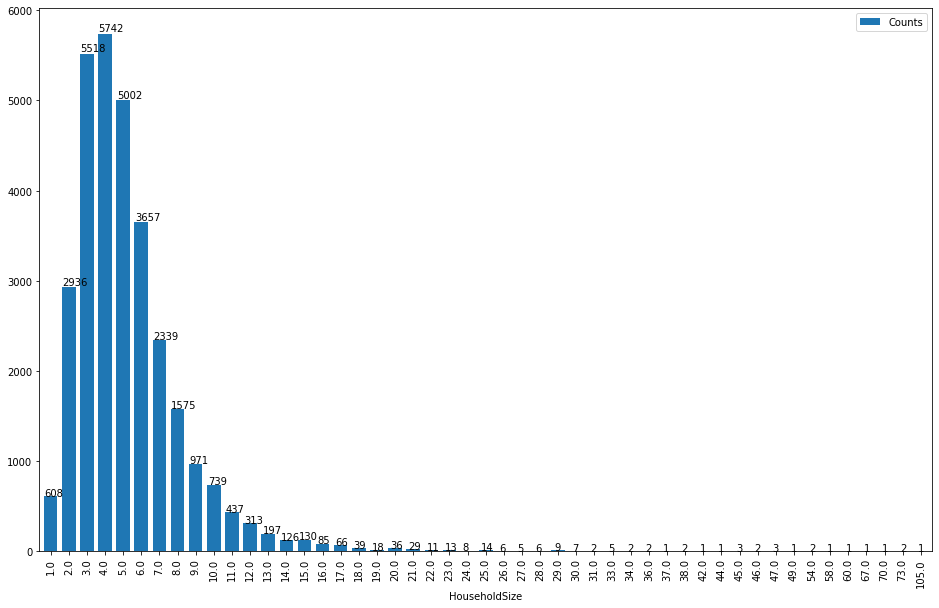

In [838]:
ax = createDFforLengthDist(d, 'Household Size', 'HouseholdSize').plot(kind='bar', figsize=(16, 10), width=0.75, x='HouseholdSize', y='Counts')
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))


In [839]:
d.head()

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect,Household Name Calculated,WFP Document Type,WFP Document Num
0,TOTOAL3855999,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,8.0,Carte NINA,17806102001013F,Maiga,Bocar,NaN,HD,P,M,MA,1978-12-31 00:00:00,42.235616,NaN,92266622.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00000,Carte NINA,17806102001013F
1,TOTOAL28284255,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,3.0,Carte NINA,26606102001001H,MAIGA,Mariama Alkaya,NaN,HD,P,F,DV,1966-12-31 00:00:00,54.243836,NaN,77578923.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00001,Carte NINA,26606102001001H
2,TOTOAL7737311,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,7.0,NaN,NaN,Ag mohamed,Almouloud,NaN,HD,P,M,MA,1958-10-01 00:00:00,62.498630,NaN,74419490.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00002,WFP ID,MLTOTOCODA00002_1
3,TOTOAL11857573,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,5.0,NaN,NaN,Ag didi,Awayi,NaN,HD,P,M,MA,1960-03-20 00:00:00,61.030137,NaN,70618466.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00003,WFP ID,MLTOTOCODA00003_1
4,TOTOAL15586805,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Infazouane,NaN,8.0,NaN,NaN,Ag Mossa,Daoud,NaN,HD,P,M,MA,1961-12-31 00:00:00,59.246575,NaN,91300753.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Infazouane,MLTOTOCOIN00004,WFP ID,MLTOTOCOIN00004_1


### Age

In [840]:
d.Age.head()

0    42.235616
1    54.243836
2    62.498630
3    61.030137
4    59.246575
Name: Age, dtype: float64

In [841]:
d.Age.isna().sum()

0

In [842]:
if d.Age.dtype == 'float64':
    d.Age = d.Age.astype(int)
    d.Age.dtype
d.Age.head()

0    42
1    54
2    62
3    61
4    59
Name: Age, dtype: int32

### Date of Birth

In [843]:
d['Date of Birth'].isna().sum()

0

In [848]:
d.Gender.value_counts()

M    25941
F     4735
Name: Gender, dtype: int64

In [845]:
d.head(3)

,Household Name,region,cercle,commune,Location,Address,Household Size,Document Type,Document Num,Last Name,First Name,Middle Name,Household Role,Recipient,Gender,Marital Status,Date of Birth,Age,Phone Number,Mobile Number,Act12,Filename,isLocationCorrect,Household Name Calculated,WFP Document Type,WFP Document Num
0,TOTOAL3855999,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,8.0,Carte NINA,17806102001013F,Maiga,Bocar,NaN,HD,P,M,MA,1978-12-31 00:00:00,42,NaN,92266622.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00000,Carte NINA,17806102001013F
1,TOTOAL28284255,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Toya(Alafia),NaN,3.0,Carte NINA,26606102001001H,MAIGA,Mariama Alkaya,NaN,HD,P,F,DV,1966-12-31 00:00:00,54,NaN,77578923.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Toya(Alafia),MLTOTOCOTO00001,Carte NINA,26606102001001H
2,TOTOAL7737311,TOMBOUCTOU,Tombouctou,COM. DE ALAFIA,Dag Abazanga I,NaN,7.0,NaN,NaN,Ag mohamed,Almouloud,NaN,HD,P,M,MA,1958-10-01 00:00:00,62,NaN,74419490.0,Oui,Alafia_Beneficiary_act12+act1_Ok.xlsx,Dag Abazanga I,MLTOTOCODA00002,WFP ID,MLTOTOCODA00002_1


## Generate the Template

In [849]:
df_template['Household Name'] = df['Household Name Calculated']
df_template['Location'] = df['Location']
df_template['Address'] = df['Address']
df_template['Household Size'] = df['Household Size']
df_template['Document Type'] = df['WFP Document Type']
df_template['Document Num'] = df['WFP Document Num']
df_template['Last Name'] = df['Last Name']
df_template['First Name'] = df['First Name']
df_template['Middle Name'] = df['Middle Name']
df_template['Household Role'] = 'HD'
df_template['Recipient'] = 'P'
df_template['Gender'] = df['Gender']
df_template['Marital Status'] = df['Marital Status']
df_template['Date of Birth'] = df['Date of Birth']
df_template['Age'] = df['Age']
df_template['Mobile Number'] =  df['Mobile Number'].astype(str).replace('.0', '')

In [852]:
df_template.isna().sum()

Household Name                    9
Location                          9
Address                       30678
Household Size                    2
Document Type                     0
Document Num                      9
Last Name                         2
First Name                        2
Middle Name                   29757
Household Role                    0
Recipient                         0
Gender                            2
Marital Status                    2
Date of Birth                     2
Age                               2
Phone Number                  30678
Mobile Number                     0
Bank Account Number           30678
Household Vulnerable          30678
Language Code                 30678
E Card Status                 30678
Physical Disability Status    30678
Mental Disability Status      30678
Orphan                        30678
Height                        30678
Weight                        30678
MUAC                          30678
Breastfeeding               

In [856]:
df_template.drop(df_template[df_template['Last Name'].isna()].index, inplace=True)

In [857]:
df_template.drop(df_template[df_template['Household Name'].isna()].index, inplace=True)

In [858]:
df_template.isna().sum()

Household Name                    0
Location                          0
Address                       30669
Household Size                    0
Document Type                     0
Document Num                      0
Last Name                         0
First Name                        0
Middle Name                   29748
Household Role                    0
Recipient                         0
Gender                            0
Marital Status                    0
Date of Birth                     0
Age                               0
Phone Number                  30669
Mobile Number                     0
Bank Account Number           30669
Household Vulnerable          30669
Language Code                 30669
E Card Status                 30669
Physical Disability Status    30669
Mental Disability Status      30669
Orphan                        30669
Height                        30669
Weight                        30669
MUAC                          30669
Breastfeeding               

In [864]:
book = load_workbook(output + 'Importation Template.xlsx')
writer = pd.ExcelWriter(output + 'Importation Template.xlsx', engine='openpyxl') 
writer.book = book

writer.sheets = dict((ws.title, ws) for ws in book.worksheets)

df_template.to_excel(writer, index= False, sheet_name= "Data", startrow=2)

writer.save()
writer.close()

C:\Program Files\Python39\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
